- Title of Final Project: Comprehensive Analysis of US Stock Market (S&P 500) and Bond Market (10-Year Treasury)
- Group Number: 17
- Student Name: Zun Cao
- Student UT EID: zc6222
- Student Name: Joylyn Qiao
- Student UT EID: yq2596
- Date:10/11/2024

## Goal: 
In this project, the goal is to systematically compare the performance and relationship between the US stock market (S&P 500) and the US bond market (10-Year Treasury Yield). By analyzing key metrics such as daily returns, volatility, and correlation, the project aims to understand how these two markets react to macroeconomic factors like interest rates and inflation. The findings will provide insights into the behavior of stocks and bonds under different economic conditions and help optimize portfolio strategies based on this relationship. 

In [1]:
# import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import altair as alt
import warnings
warnings.filterwarnings("ignore")

In [2]:
# read data file
treasury = pd.read_csv('./us_treasury_yields_daily.csv')
SP_500 = pd.read_csv('./HistoricalData_1727471109460.csv')

### The units for the stock and bond data:

S&P 500 Data (Stock Market):

Closing Price (Close/Last), Open, High, and Low prices are measured in US dollars (USD). These represent the index value of the S&P 500 on specific dates. The index itself is a composite of 500 large companies' stock prices, scaled for easier comparison.  

US Treasury Yields (Bond Market):

The values (e.g., US10Y for the 10-Year Treasury Yield) are expressed in percentage yields (% per annum). These represent the annualized return that an investor would earn by holding the bond to maturity. For example, a 10-year Treasury yield of 3% means an investor would expect to earn a 3% return annually over the bond’s lifetime.

### Explore two datasets

#### S&P 500 information

In [3]:
SP_500.shape

(2527, 5)

In [4]:
SP_500.head(5)

,Date,Close/Last,Open,High,Low
0,09/26/2024,5745.37,5762.22,5767.37,5721.01
1,09/25/2024,5722.26,5733.65,5741.03,5712.06
2,09/24/2024,5732.93,5727.66,5735.32,5698.99
3,09/23/2024,5718.57,5711.90,5725.36,5704.22
4,09/20/2024,5702.55,5709.64,5715.14,5674.49


In [5]:
SP_500.tail(5)

,Date,Close/Last,Open,High,Low
2522,10/03/2014,1967.90,1948.12,1971.19,1948.12
2523,10/02/2014,1946.17,1945.83,1952.32,1926.03
2524,10/01/2014,1946.16,1971.44,1971.44,1941.72
2525,09/30/2014,1972.29,1978.21,1985.17,1968.96
2526,09/29/2014,1977.80,1978.96,1981.28,1964.04


In [6]:
SP_500.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2527 entries, 0 to 2526
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Date        2527 non-null   object 
 1   Close/Last  2527 non-null   float64
 2   Open        2527 non-null   float64
 3   High        2527 non-null   float64
 4   Low         2527 non-null   float64
dtypes: float64(4), object(1)
memory usage: 98.8+ KB


In [7]:
SP_500.describe()

,Close/Last,Open,High,Low
count,2527.000000,2527.000000,2527.000000,2527.000000
mean,3248.786605,3239.291159,3256.691369,3220.632493
std,1021.432668,1040.431296,1046.164496,1034.644979
min,1829.080000,0.000000,0.000000,0.000000
25%,2356.435000,2354.835000,2364.645000,2344.475000
50%,2926.460000,2924.670000,2938.840000,2913.480000
75%,4137.465000,4136.835000,4161.665000,4113.410000
max,5745.370000,5762.220000,5767.370000,5721.010000


In [8]:
categorical_columns_SP_500 = SP_500.select_dtypes(include = 'category').columns
print('Categorical columns: ')
categorical_columns_SP_500

Categorical columns: 


Index([], dtype='object')

In [9]:
discrete_columns_SP_500 = SP_500.select_dtypes(include = 'number').columns
print('Discrete columns: ')
discrete_columns_SP_500

Discrete columns: 


Index(['Close/Last', 'Open', 'High', 'Low'], dtype='object')

#### Treasury information

In [10]:
treasury.shape

(16299, 12)

In [11]:
treasury.head(5)

,date,US1M,US3M,US6M,US1Y,US2Y,US3Y,US5Y,US7Y,US10Y,US20Y,US30Y
0,1962-01-02,NaN,NaN,NaN,3.22,NaN,3.70,3.88,NaN,4.06,4.07,NaN
1,1962-01-03,NaN,NaN,NaN,3.24,NaN,3.70,3.87,NaN,4.03,4.07,NaN
2,1962-01-04,NaN,NaN,NaN,3.24,NaN,3.69,3.86,NaN,3.99,4.06,NaN
3,1962-01-05,NaN,NaN,NaN,3.26,NaN,3.71,3.89,NaN,4.02,4.07,NaN
4,1962-01-08,NaN,NaN,NaN,3.31,NaN,3.71,3.91,NaN,4.03,4.08,NaN


In [12]:
treasury.tail(5)

,date,US1M,US3M,US6M,US1Y,US2Y,US3Y,US5Y,US7Y,US10Y,US20Y,US30Y
16294,2024-06-17,5.45,5.52,5.39,5.11,4.75,4.50,4.30,4.28,4.28,4.52,4.40
16295,2024-06-18,5.40,5.50,5.37,5.09,4.69,4.43,4.24,4.22,4.22,4.47,4.36
16296,2024-06-19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
16297,2024-06-20,5.42,5.50,5.37,5.10,4.70,4.45,4.26,4.25,4.25,4.49,4.39
16298,2024-06-21,5.42,5.49,5.36,5.10,4.70,4.45,4.26,4.25,4.25,4.49,4.39


In [13]:
treasury.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16299 entries, 0 to 16298
Data columns (total 12 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   date    16299 non-null  object 
 1   US1M    5726 non-null   float64
 2   US3M    10702 non-null  float64
 3   US6M    10702 non-null  float64
 4   US1Y    15604 non-null  float64
 5   US2Y    12012 non-null  float64
 6   US3Y    15604 non-null  float64
 7   US5Y    15604 non-null  float64
 8   US7Y    13734 non-null  float64
 9   US10Y   15604 non-null  float64
 10  US20Y   13915 non-null  float64
 11  US30Y   11834 non-null  float64
dtypes: float64(11), object(1)
memory usage: 1.5+ MB


In [14]:
treasury.describe()

,US1M,US3M,US6M,US1Y,US2Y,US3Y,US5Y,US7Y,US10Y,US20Y,US30Y
count,5726.000000,10702.000000,10702.000000,15604.000000,12012.000000,15604.000000,15604.000000,13734.000000,15604.000000,13915.000000,11834.000000
mean,1.472312,3.806970,3.984651,4.903730,5.000342,5.285561,5.533978,5.868119,5.858961,5.889945,6.221317
std,1.728150,3.186081,3.291684,3.399996,3.728723,3.288418,3.162893,3.227755,2.966031,2.873207,3.023930
min,0.000000,0.000000,0.020000,0.040000,0.090000,0.100000,0.190000,0.360000,0.520000,0.870000,0.990000
25%,0.070000,0.820000,0.970000,2.220000,1.620000,2.760000,3.190000,3.150000,3.860000,4.030000,3.800000
50%,0.895000,3.780000,3.985000,4.980000,4.780000,5.170000,5.395000,5.980000,5.580000,5.340000,5.620000
75%,2.220000,5.680000,5.880000,6.762500,7.230000,7.250000,7.450000,7.840000,7.600000,7.340000,8.177500
max,6.020000,17.010000,17.430000,17.310000,16.950000,16.590000,16.270000,16.050000,15.840000,15.780000,15.210000


In [15]:
categorical_columns_treasury = treasury.select_dtypes(include = 'category').columns
print('Categorical columns: ')
categorical_columns_treasury

Categorical columns: 


Index([], dtype='object')

In [16]:
discrete_columns_treasury = treasury.select_dtypes(include = 'number').columns
print('Discrete columns: ')
discrete_columns_treasury

Discrete columns: 


Index(['US1M', 'US3M', 'US6M', 'US1Y', 'US2Y', 'US3Y', 'US5Y', 'US7Y', 'US10Y',
       'US20Y', 'US30Y'],
      dtype='object')

### Data Wrangling

In [17]:
# Filter data to only include rows from June 2014 to the most recent available data
treasury['date'] = pd.to_datetime(treasury['date']) 
filtered_treasury = treasury[(treasury['date'] >= '2014-06-01') & (treasury['date'] <= '2024-12-31')] 

In [18]:
# Filter data to only include rows from June 2014 to the most recent available data
SP_500['Date'] = pd.to_datetime(SP_500['Date'])  
filtered_SP_500 = SP_500[(SP_500['Date'] >= '2014-06-01') & (SP_500['Date'] <= '2024-12-31')]

In [19]:
null_sp500_missing = filtered_SP_500.isnull().sum()
treasury_missing = filtered_treasury.isnull().sum() 

In [20]:
print('S&P 500 missing: ')
null_sp500_missing

S&P 500 missing: 


Date          0
Close/Last    0
Open          0
High          0
Low           0
dtype: int64

In [21]:
print('treasury missing: ')
treasury_missing

treasury missing: 


date       0
US1M     108
US3M     108
US6M     108
US1Y     108
US2Y     108
US3Y     108
US5Y     108
US7Y     108
US10Y    108
US20Y    108
US30Y    108
dtype: int64

In [22]:
filtered_treasury = filtered_treasury.dropna()
# rename the column for later merge
filtered_treasury.rename(columns = {'date' : 'Date'}, inplace = True)

In [23]:
# Do an inner merge to get non-empty data for all columns
merged_data = pd.merge(filtered_SP_500, filtered_treasury, on='Date', how='inner')
merged_data.sort_values(by = 'Date', ascending = True, inplace = True)

In [24]:
filtered_treasury.isnull().sum() 

Date     0
US1M     0
US3M     0
US6M     0
US1Y     0
US2Y     0
US3Y     0
US5Y     0
US7Y     0
US10Y    0
US20Y    0
US30Y    0
dtype: int64

In [25]:
merged_data.head(5)

,Date,Close/Last,Open,High,Low,US1M,US3M,US6M,US1Y,US2Y,US3Y,US5Y,US7Y,US10Y,US20Y,US30Y
2431,2014-09-29,1977.80,1978.96,1981.28,1964.04,0.01,0.02,0.05,0.11,0.58,1.06,1.77,2.21,2.50,2.95,3.18
2430,2014-09-30,1972.29,1978.21,1985.17,1968.96,0.02,0.02,0.03,0.13,0.58,1.07,1.78,2.22,2.52,2.98,3.21
2429,2014-10-01,1946.16,1971.44,1971.44,1941.72,0.01,0.02,0.04,0.10,0.53,1.00,1.69,2.12,2.42,2.87,3.12
2428,2014-10-02,1946.17,1945.83,1952.32,1926.03,0.01,0.01,0.03,0.10,0.53,1.01,1.70,2.14,2.44,2.90,3.15
2427,2014-10-03,1967.90,1948.12,1971.19,1948.12,0.01,0.01,0.03,0.11,0.57,1.05,1.73,2.16,2.45,2.89,3.13


In [26]:
merged_data.tail(5)

,Date,Close/Last,Open,High,Low,US1M,US3M,US6M,US1Y,US2Y,US3Y,US5Y,US7Y,US10Y,US20Y,US30Y
4,2024-06-14,5431.60,5424.08,5432.39,5403.75,5.47,5.51,5.36,5.07,4.67,4.41,4.22,4.20,4.20,4.46,4.34
3,2024-06-17,5473.23,5431.11,5488.50,5420.40,5.45,5.52,5.39,5.11,4.75,4.50,4.30,4.28,4.28,4.52,4.40
2,2024-06-18,5487.03,5476.15,5490.38,5471.32,5.40,5.50,5.37,5.09,4.69,4.43,4.24,4.22,4.22,4.47,4.36
1,2024-06-20,5473.17,5499.99,5505.53,5455.56,5.42,5.50,5.37,5.10,4.70,4.45,4.26,4.25,4.25,4.49,4.39
0,2024-06-21,5464.62,5466.77,5478.31,5452.03,5.42,5.49,5.36,5.10,4.70,4.45,4.26,4.25,4.25,4.49,4.39


## Point 1: Stock vs. Bond Market Performance
Stocks are typically more volatile but offer higher potential returns compared to bonds, which are more stable but offer lower returns.  
Visual: A time series plot showing daily cumulative returns for both stocks and bonds over the last 10 years.   
Visual Tool: Plotly

### Daily Returns Calculation

**Daily Returns** refer to the percentage change of the price of a stock or bond compared to the previous day. It measures how much the investment has grown or declined. The formula for calculating returns is:

$$
\text{Return} = \frac{\text{Current Price} - \text{Previous Price}}{\text{Previous Price}} \times 100
$$

Or simplified as:

$$
\text{Return} = \left( \frac{\text{Current Price}}{\text{Previous Price}} - 1 \right) \times 100
$$

In the code, we use the `pct_change()` function to calculate the daily perce.pct_change() * 100


In [27]:
# Calculate daily returns for both stock and bond data in the merged dataset
merged_data['Stock_Returns'] = merged_data['Close/Last'].pct_change() * 100
merged_data['Bond_Returns'] = merged_data['US10Y'].pct_change() * 100

In [28]:
merged_data[['Stock_Returns', 'Bond_Returns']].isna().sum()

Stock_Returns    1
Bond_Returns     1
dtype: int64

In [29]:
# Drop rows with NaN values (the returns of the first day are NaN)
merged_data = merged_data.dropna(subset=['Stock_Returns', 'Bond_Returns'])

# check if there are NaN values
merged_data[['Stock_Returns', 'Bond_Returns']].isna().sum()

Stock_Returns    0
Bond_Returns     0
dtype: int64

In [30]:
# Check for duplicate dates in the dataset
duplicate_dates = merged_data['Date'].duplicated().sum()
print(f"Number of duplicate dates: {duplicate_dates}")

# Check for gaps in the data by ensuring that dates are consecutive
date_range = pd.date_range(start=merged_data['Date'].min(), end=merged_data['Date'].max())
missing_dates = len(date_range) - len(merged_data['Date'].unique())
print(f"Number of missing dates: {missing_dates}")

Number of duplicate dates: 0
Number of missing dates: 1122


In [31]:
# Fill missing weekend dates by forward-filling the last known value
full_date_range = pd.date_range(start=merged_data['Date'].min(), end=merged_data['Date'].max())
merged_data = merged_data.set_index('Date').reindex(full_date_range).reset_index()
merged_data.rename(columns={'index': 'Date'}, inplace=True)

# Forward-fill missing values (e.g., for weekends)
merged_data['Stock_Returns'].fillna(method='ffill', inplace=True)
merged_data['Bond_Returns'].fillna(method='ffill', inplace=True)

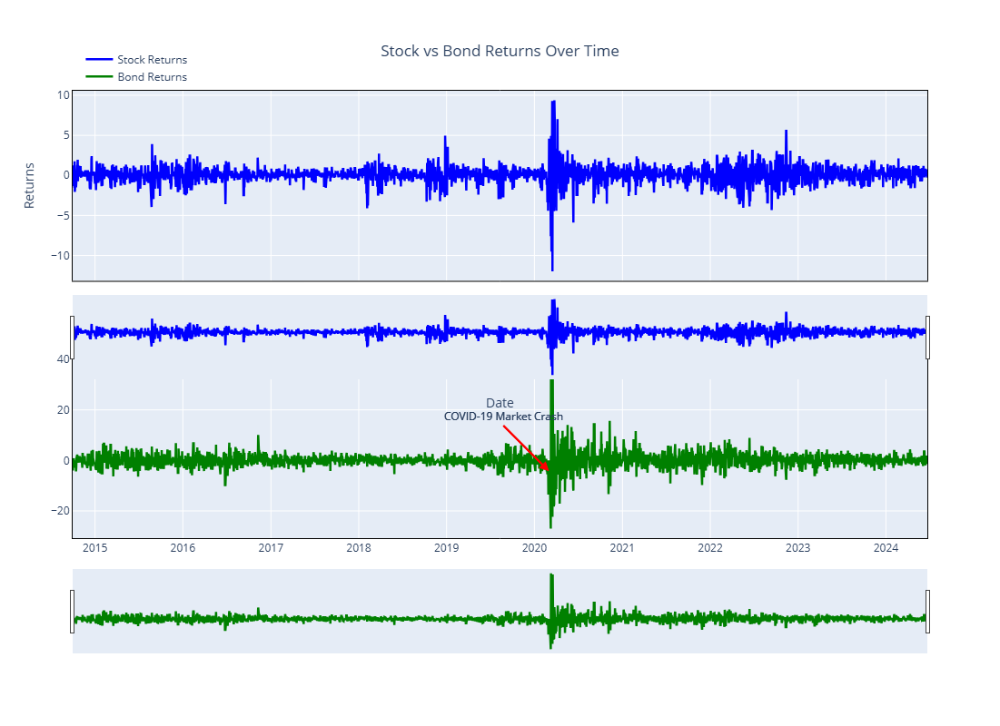

In [32]:
import plotly.graph_objs as go
from plotly.subplots import make_subplots

# Create a larger subplot to clearly visualize the relationship between Stock and Bond Returns
fig = make_subplots(rows=2, cols=1, shared_xaxes=True, 
                    subplot_titles=("Stock Returns", "Bond Returns"),
                    vertical_spacing=0.15)

# Add Stock Returns Line (Bigger, Clearer Line)
fig.add_trace(
    go.Scatter(
        x=merged_data['Date'], 
        y=merged_data['Stock_Returns'], 
        mode='lines', 
        name='Stock Returns',
        line=dict(color='blue', width=2.5),  # Make line thicker for better visibility
        hovertemplate='Date: %{x}<br>Stock Return: %{y:.2f}%'
    ),
    row=1, col=1
)

# Add Bond Returns Line (Bigger, Clearer Line)
fig.add_trace(
    go.Scatter(
        x=merged_data['Date'], 
        y=merged_data['Bond_Returns'], 
        mode='lines', 
        name='Bond Returns',
        line=dict(color='green', width=2.5),  # Make line thicker for better visibility
        hovertemplate='Date: %{x}<br>Bond Return: %{y:.2f}%'
    ),
    row=2, col=1
)

# Add Annotations for Important Events (e.g., COVID-19 Crash)
annotations = [
    dict(
        x='2020-03-01', y=0.15, xref='x', yref='paper',
        showarrow=True, arrowhead=2, arrowsize=1, arrowwidth=2,
        text="COVID-19 Market Crash", font=dict(size=12),
        ax=-50, ay=-50, arrowcolor='red'
    )
]

# Add Range Slider for Zooming
fig.update_xaxes(rangeslider_visible=True)

# Update Layout with Better Styling
fig.update_layout(
    title={
        'text': "Stock vs Bond Returns Over Time",
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    xaxis_title="Date",
    yaxis_title="Returns",
    hovermode="x unified",  # Consistent hover across both subplots
    legend=dict(
        x=0.01, y=1.1, traceorder="normal",
        bgcolor="rgba(0,0,0,0)",
        bordercolor="Black"
    ),
    annotations=annotations,
    width=1200,  # Larger width
    height=800,  # Larger height
)

# Update Axes for Neatness
fig.update_xaxes(showline=True, linewidth=1, linecolor='black', mirror=True)
fig.update_yaxes(showline=True, linewidth=1, linecolor='black', mirror=True)

# Enable panning and zooming
fig.update_layout(dragmode="pan")

# Show the figure
fig.show()



The plot shows that stocks are much more volatile than bonds, especially during economic downturns like the COVID-19 market crash in 2020. While stock returns fluctuate widely and drop sharply during crises, bond returns tend to stay more stable, even though they show some increased volatility during stressful periods. This difference highlights why bonds are often seen as a safer investment, providing a steady balance to the higher risks in stocks, especially when markets are unpredictable. Overall, bonds can help cushion against stock market losses in a diversified portfolio.

### Cumulative Returns Formula

**Cumulative Returns** measure the total increase or decrease in the value of an investment over time, considering the compounding effect of daily returns. It helps to understand how much an investment has grown or shrunk over a specific period.

The formula for **Cumulative Return** is:

$$
\text{Cumulative Return} = \left( \prod_{t=1}^{T} \left(1 + \frac{\text{Return on day t}}{100}\right) \right) - 1
$$

Where:
- $T$ is the total number of days.
- $ \text{Return on day t}$ on is the percentage return for day $t$.

In [33]:
# Cumulative returns for stocks (S&P 500)
merged_data['Cumulative_Stock_Returns'] = (1 + merged_data['Stock_Returns'] / 100).cumprod() - 1

# Cumulative returns for bonds (10-Year Treasury Yield)
merged_data['Cumulative_Bond_Returns'] = (1 + merged_data['Bond_Returns'] / 100).cumprod() - 1

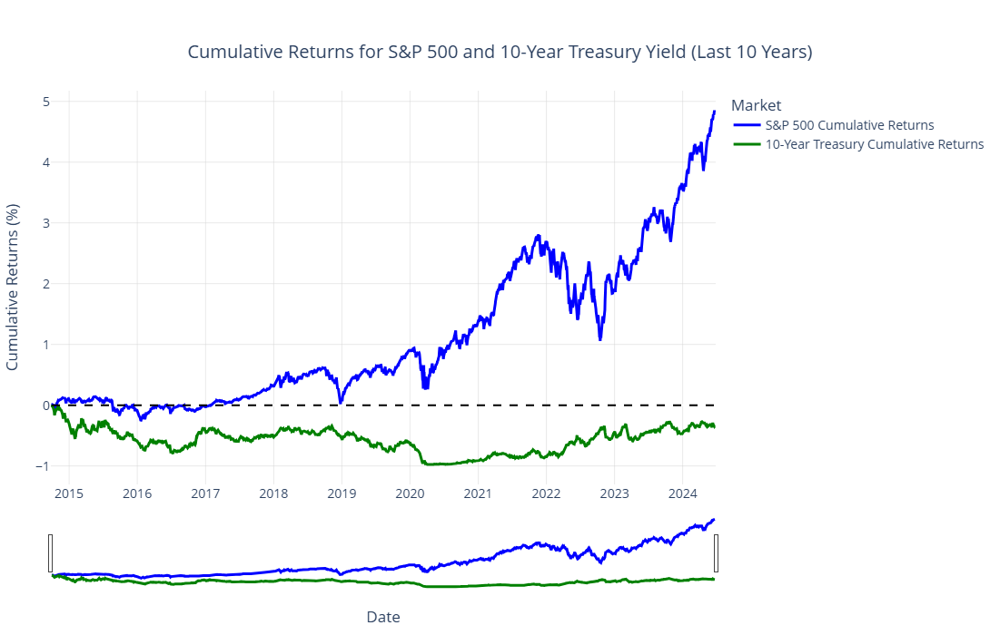

In [34]:
import plotly.graph_objs as go

# Create a larger and clearer Plotly figure
fig = go.Figure()

# Add cumulative stock returns to the plot (using index for x-axis)
fig.add_trace(go.Scatter(
    x=merged_data['Date'],  # Use index for date
    y=merged_data['Cumulative_Stock_Returns'],
    mode='lines',
    name='S&P 500 Cumulative Returns',
    line=dict(color='blue', width=3),  # Thicker line for clarity
    hoverinfo='x+y'
))

# Add cumulative bond returns to the plot (using index for x-axis)
fig.add_trace(go.Scatter(
    x=merged_data['Date'],  # Use index for date
    y=merged_data['Cumulative_Bond_Returns'],
    mode='lines',
    name='10-Year Treasury Cumulative Returns',
    line=dict(color='green', width=3),  # Thicker line for clarity
    hoverinfo='x+y'
))

# Add a dashed line at 0% to indicate break-even point
fig.add_shape(type="line",
              x0=merged_data['Date'].min(), y0=0, x1=merged_data['Date'].max(), y1=0,
              line=dict(color="black", width=2, dash="dash"),
              name='Break-even line')

# Customize titles and labels
fig.update_layout(
    title={
        'text': 'Cumulative Returns for S&P 500 and 10-Year Treasury Yield (Last 10 Years)',
        'x': 0.5,  # Center the title
        'xanchor': 'center',
        'yanchor': 'top'
    },
    xaxis_title='Date',
    yaxis_title='Cumulative Returns (%)',
    hovermode='x unified',  # Unified hover for both lines
    legend_title_text='Market',
    plot_bgcolor='white',  # White background for clarity
    font=dict(size=14)  # Increase font size for readability
)

# Add grid and range slider for better interaction
fig.update_xaxes(rangeslider_visible=True, 
                 showgrid=True, gridwidth=0.5, gridcolor='lightgray')
fig.update_yaxes(showgrid=True, gridwidth=0.5, gridcolor='lightgray')

# Increase figure size for better readability
fig.update_layout(
    width=1200,  # Increase width
    height=700,  # Increase height
    margin=dict(l=50, r=50, t=100, b=50)  # Set margins for neatness
)

# Show the improved interactive plot
fig.show()


### Visual Layout of this graph
- **Visuals**:
  - **Blue line**: S&P 500 cumulative returns.
  - **Green line**: 10-Year Treasury cumulative returns.
- **Interactivity**:
  - **Hover tool**: Displays exact values for cumulative returns on hover.
  - **Zoom & Pan**: Allows exploration of specific time periods.
  - **Range slider**: Enables dynamic adjustment of the visible date range.
- **Colors**: Blue for stocks, green for bonds.
- **Annotations**: Light gray gridlines for clarity, with a clear legend to distinguish between stocks and bonds.
- **Axes**: X-axis shows the date, Y-axis shows cumulative returns in percentage.


## Point 2: Correlation between Stock and Bond Returns
While stocks and bonds may be weakly correlated in normal times, their relationship often changes during periods of economic stress (e.g., stock-bond negative correlation during crises).

Visual: A rolling correlation plot between stock and bond returns over a 30-day window.  
Visual Tools: Altair

In [35]:

merged_data['Rolling_Correlation'] = merged_data['Stock_Returns'].rolling(window=30).corr(merged_data['Bond_Returns'])

# Step 1: Create a category column based on Rolling_Correlation thresholds
def categorize_correlation(value):
    if value > 0.5:
        return 'Positive'
    elif value < -0.5:
        return 'Negative'
    else:
        return 'Neutral'

merged_data['Correlation_Category'] = merged_data['Rolling_Correlation'].apply(categorize_correlation)

# Step 2: Create a scatter plot with color based on Correlation_Category
scatter_chart = alt.Chart(merged_data).mark_circle(size=60, opacity=0.7).encode(
    x=alt.X('Date:T', title='Date', axis=alt.Axis(labelFontSize=12, titleFontSize=14)),
    y=alt.Y('Rolling_Correlation:Q', title='Rolling 30-Day Correlation', axis=alt.Axis(labelFontSize=12, titleFontSize=14)),
    color=alt.Color('Correlation_Category:N', 
                    scale=alt.Scale(domain=['Positive', 'Negative', 'Neutral'],
                                    range=['green', 'red', 'gray']),
                    legend=alt.Legend(title="Correlation Category")),
    tooltip=['Date:T', 'Rolling_Correlation:Q']
).properties(
    title=alt.TitleParams(
        text='Rolling 30-Day Correlation Between S&P 500 and 10-Year Treasury Returns (2014-2024)',
        fontSize=16,
        anchor='middle',
        color='black'
    ),
    width=1000,
    height=500
)

# Step 3: Add a line connecting the points for continuous visualization
line_chart = alt.Chart(merged_data).mark_line(strokeWidth=2, color='grey').encode(
    x='Date:T',
    y='Rolling_Correlation:Q'
)

# Step 4: Add annotations for significant economic events
annotations = pd.DataFrame([
    {'Date': '2016-06-24', 'Event': 'Brexit Vote'},
    {'Date': '2020-03-01', 'Event': 'COVID-19 Market Crash'},
    {'Date': '2022-02-24', 'Event': 'Russia-Ukraine Conflict'}
])

annotation_layer = alt.Chart(annotations).mark_rule(
    color='red', strokeDash=[5, 5], size=2
).encode(
    x='Date:T',
    tooltip=['Event']
)

# Step 5: Add threshold lines at 0.0 and +/-0.5 for reference
zero_line = alt.Chart(pd.DataFrame({'y': [0]})).mark_rule(
    strokeDash=[4, 4], color='black', size=2
).encode(
    y='y:Q'
)

positive_threshold = alt.Chart(pd.DataFrame({'y': [0.5]})).mark_rule(
    strokeDash=[4, 4], color='gray', size=1.5
).encode(
    y='y:Q'
)

negative_threshold = alt.Chart(pd.DataFrame({'y': [-0.5]})).mark_rule(
    strokeDash=[4, 4], color='gray', size=1.5
).encode(
    y='y:Q'
)

# Combine scatter, line, annotations, and threshold lines into the final chart
final_chart = (
    line_chart + scatter_chart + annotation_layer + zero_line + positive_threshold + negative_threshold
).interactive()  # Enable zooming and panning

# Display the final combined chart
final_chart


alt.LayerChart(...)

### Summary of Findings from the 30-Day Rolling Correlation Plot

The 30-day rolling correlation plot between **S&P 500 (stocks)** and **10-Year Treasury yields (bonds)** reveals key insights into how the relationship between these assets varies in different market conditions:

#### 1. Weak Correlation in Normal Periods
- For most of the time period (2014-2024), the correlation between stocks and bonds fluctuates between **-0.5 and +0.5**, indicating a generally weak or low correlation in normal market conditions.
- This weak correlation suggests that stocks and bonds tend to move somewhat independently, which aligns with typical investor behavior in stable markets where stocks and bonds are viewed as distinct asset classes with different risk characteristics.

#### 2. Negative Correlation During Economic Crises
- During periods of economic stress, such as the **COVID-19 market crash (early 2020)** and the **Russia-Ukraine conflict (early 2022)**, the correlation dips significantly into the negative range.
- This shift towards a **negative correlation** suggests that bonds act as a safe-haven asset during crises, with investors shifting from stocks to bonds. This leads to rising bond prices (or yields decreasing) as stock prices fall, indicating an inverse relationship.

#### 3. Thresholds Indicating Significant Correlation Levels
- The dashed horizontal lines at **0.0**, **+0.5**, and **-0.5** provide reference points for interpreting the strength of correlation.
  - In normal conditions, the correlation rarely reaches these thresholds, staying closer to zero.
  - During crises, the correlation often approaches or crosses the -0.5 line, highlighting the strong negative relationship between stocks and bonds during these periods.

#### 4. Long-Term Shifts in Correlation
- Over the span of a decade, we observe that the correlation reverts to near-zero levels after each crisis, although it may remain slightly negative in the immediate aftermath of major economic events.
- This trend suggests that crises not only lead to temporary negative correlations but may also have a lasting effect on investor behavior and asset relationships for a period of time following the event.

### Conclusion
- **In stable periods**: The correlation between stocks and bonds is generally low or weak, reflecting their independent market behavior.
- **During economic crises**: The correlation becomes significantly negative as investors move towards bonds as a safe haven, leading to an inverse relationship.
- **Post-crisis behavior**: Market stress events have a lasting impact, as correlation levels do not immediately revert and may remain lower than average for some time.

These findings can inform portfolio construction and risk management strategies, highlighting the importance of bonds as a diversifying asset, especially during periouence stock-bond correlation.


## Point 3: Volatility Comparison
Stocks exhibit higher volatility compared to bonds, especially during periods of market uncertainty.

Visual: A side-by-side comparison of rolling volatility (standard deviation) for both stocks and bonds over time.  
Visual Tools: Plotly


### Explanation of Rolling 30-Day Volatility Calculation

**Volatility** is a measure of how much the price of a financial asset fluctuates over time. In finance, volatility is typically measured by the **standard deviation** of returns. The higher the volatility, the greater the risk or price swings.

In this case, we are calculating the **30-day rolling volatility** for both **S&P 500** (stock returns) and **10-Year Treasury Yield** (bond returns). A rolling window is applied to smooth out short-term fluctuations and observe long-term trends.

In [36]:
# Calculate rolling 30-day volatility (standard deviation) for both stock and bond returns
merged_data['Stock_Rolling_Volatility'] = merged_data['Stock_Returns'].rolling(window=30).std()
merged_data['Bond_Rolling_Volatility'] = merged_data['Bond_Returns'].rolling(window=30).std()

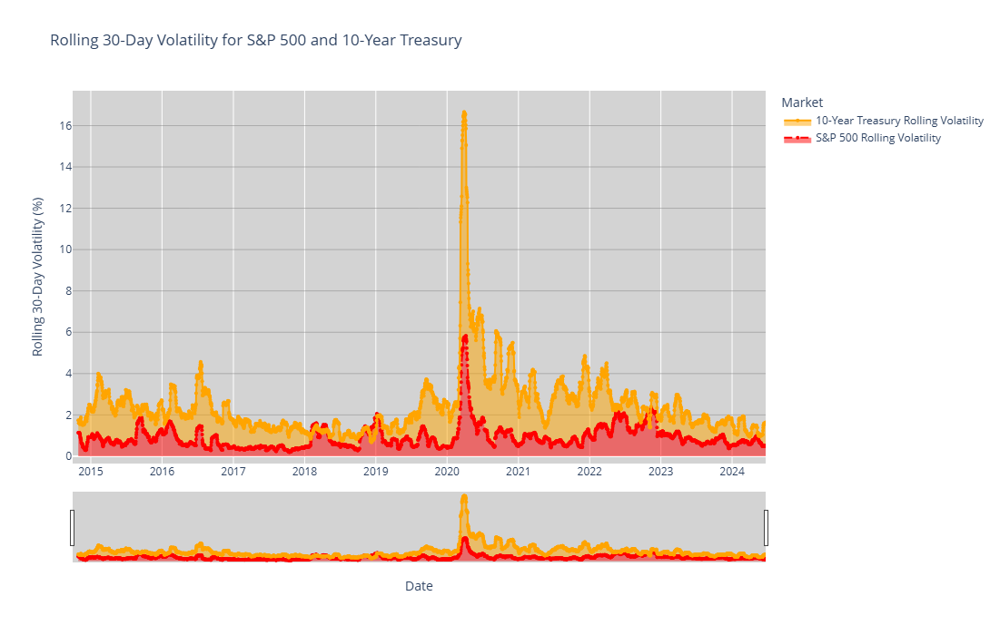

In [37]:

# Create a Plotly figure
fig = go.Figure()

# Add stock rolling volatility trace with filled area and dashed line
fig.add_trace(go.Scatter(
    x=merged_data['Date'], 
    y=merged_data['Stock_Rolling_Volatility'], 
    mode='lines+markers', 
    name='S&P 500 Rolling Volatility',
    line=dict(color='red', dash='dash'),
    marker=dict(size=4),
    fill='tozeroy',  # Fill the area below the line
    hoverinfo='x+y'
))

# Add bond rolling volatility trace with a different line style
fig.add_trace(go.Scatter(
    x=merged_data['Date'], 
    y=merged_data['Bond_Rolling_Volatility'], 
    mode='lines+markers', 
    name='10-Year Treasury Rolling Volatility',
    line=dict(color='orange', dash='solid'),
    marker=dict(size=4),
    hoverinfo='x+y',
    fill='tonexty'  # Fill the area between this line and the previous one
))

# Customize the layout with a new color theme, titles, and labels
fig.update_layout(
    title='Rolling 30-Day Volatility for S&P 500 and 10-Year Treasury',
    xaxis_title='Date',
    yaxis_title='Rolling 30-Day Volatility (%)',
    hovermode='x unified',
    legend_title_text='Market',
    plot_bgcolor='lightgray',  # Changed background for better contrast
    paper_bgcolor='white',
    width=1200, 
    height=700 
)

# Add zooming, panning, and range slider for interaction
fig.update_xaxes(rangeslider_visible=True)
fig.update_yaxes(showgrid=True, gridwidth=0.5, gridcolor='gray')

# Show the plot
fig.show()

## Analysis of 30-Day Rolling Volatility for S&P 500 and 10-Year Treasury Yield (2014-2024)

### Key Observations:

1. **Higher Volatility in Stocks Compared to Bonds**:
   - The S&P 500's 30-day rolling volatility (represented by the red dashed line) consistently shows higher peaks compared to the 10-Year Treasury Yield (orange solid line).
   - This difference highlights that the stock market is generally more volatile than the bond market. Stocks experience larger and more frequent price swings, while bonds tend to offer more stability.

2. **Impact of Economic Events on Volatility**:
   - **COVID-19 Market Crash (2020)**: During early 2020, a significant spike in volatility is observed in both S&P 500 and 10-Year Treasury. The stock market's volatility surged to a peak around this time, far exceeding typical levels, as the COVID-19 pandemic led to market uncertainty and investor panic.
     - The volatility of bonds also increased, but to a much lesser extent, indicating that while bonds reacted to the crisis, they remained a relatively safer investment compared to stocks.
   - **Other Periods of Increased Volatility**:
     - The S&P 500 also shows elevated volatility in 2015-2016 and 2018, corresponding to global economic concerns (e.g., Brexit, U.S.-China trade tensions). These spikes illustrate how stocks are highly sensitive to economic and political events.
     - Bonds, on the other hand, remained relatively stable in these periods, reinforcing their role as lower-risk assets.

3. **Long-term Trends**:
   - **Stock Volatility Cycles**: The S&P 500's volatility demonstrates cyclical patterns, with sharp rises during periods of economic stress followed by gradual declines as the market stabilizes.
   - **Bond Stability**: The 10-Year Treasury Yield's volatility remains low and steady for most of the observed period, with only minor increases during extreme market events. This behavior underscores the traditional view of bonds as stable investments that can provide a buffer against stock market volatility.

### Conclusion:
The chart illustrates the contrasting risk profiles of stocks and bonds. Stocks (S&P 500) are prone to significant volatility, especially during economic crises, reflecting their higher risk and potential for large price swings. Bonds (10-Year Treasury Yield), however, offer more stability and show only mild increases in volatility even during crises, affirming their role as a safer asset class in an investment portfolio.

This relationship between stock and bond volatility supports the strategy of diversification in investment portfolios. In times of market stress, bonds tend to maintain lower volatility, potentially offsetting the high volatility of stocks and thereby reducing the overall risk of the portfolio.


## Point 4: Risk-Adjusted Performance Analysis

Stocks and bonds exhibit different risk-adjusted performance over time, which can be evaluated through metrics like the Sharpe and Sortino Ratios. These ratios provide insights into the stability and efficiency of returns relative to volatility and downside risk, respectively.

Visual: Interactive rolling plots for both the Sharpe and Sortino Ratios, allowing a side-by-side comparison of risk-adjusted performance for the S&P 500 and 10-Year Treasury over time.

Interaction: Hover tool for precise ratio values on each date, dropdown menus to isolate specific assets, and zoom/pan controls for in-depth exploration of periods with high or low risk-adjusted returns.

Visual Tools: Plotly

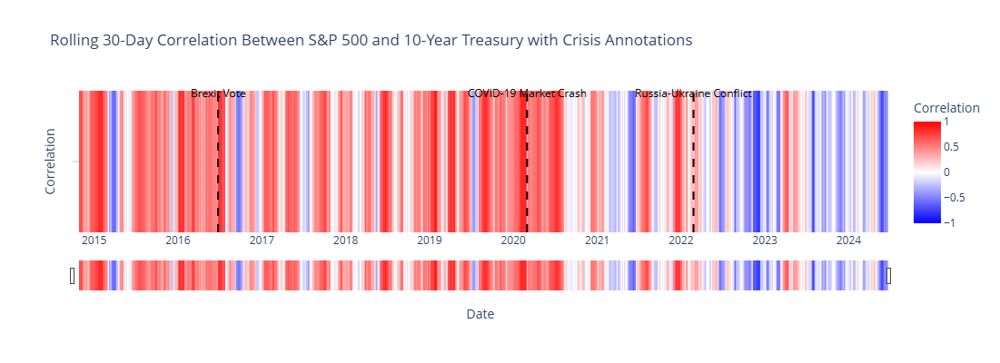

In [38]:
# Convert crisis event dates to datetime format and store as annotations
crisis_events = [
    {'date': pd.to_datetime('2016-06-24'), 'event': 'Brexit Vote'},
    {'date': pd.to_datetime('2020-03-01'), 'event': 'COVID-19 Market Crash'},
    {'date': pd.to_datetime('2022-02-24'), 'event': 'Russia-Ukraine Conflict'}
]

# Create a heatmap for the rolling correlation between stock and bond returns
fig = go.Figure(data=go.Heatmap(
    x=merged_data['Date'], 
    y=['Rolling Correlation'] * len(merged_data),  # Single row for heatmap effect
    z=merged_data['Rolling_Correlation'], 
    colorscale=[[0, 'blue'], [0.5, 'white'], [1, 'red']],
    colorbar=dict(title="Correlation"),
    zmin=-1, zmax=1,  # Correlation range from -1 to 1
    hovertemplate="Date: %{x}<br>Correlation: %{z}<extra></extra>"
))

# Add vertical lines and annotations for each crisis event
for event in crisis_events:
    # Add a vertical line for each event
    fig.add_shape(
        type="line",
        x0=event['date'], x1=event['date'],
        y0=0, y1=1,
        xref="x", yref="paper",
        line=dict(color="black", width=2, dash="dash")
    )
    
    # Add an annotation for each event
    fig.add_annotation(
        x=event['date'],
        y=1.05,  # Position above the plot
        xref="x",
        yref="paper",
        text=event['event'],
        showarrow=False,
        font=dict(size=12, color="black")
    )

# Customize layout
fig.update_layout(
    title='Rolling 30-Day Correlation Between S&P 500 and 10-Year Treasury with Crisis Annotations',
    xaxis_title='Date',
    yaxis_title='Correlation',
    yaxis=dict(showticklabels=False),  # Hide y-axis labels to emphasize heatmap style
    hovermode='x unified',
    plot_bgcolor='white',
    width=1000,
    height=400
)

# Add zooming, panning, and range slider for interaction
fig.update_xaxes(rangeslider_visible=True)
fig.update_yaxes(showgrid=True, gridwidth=0.5, gridcolor='gray')

# Show the plot
fig.show()

## Sharpe Ratio

**Definition**: The Sharpe Ratio measures the risk-adjusted return of an asset by comparing the asset's excess return (over a risk-free rate) to its total volatility (standard deviation of returns). A higher Sharpe Ratio indicates better risk-adjusted performance.

**Formula**:
$$
\text{Sharpe Ratio} = \frac{E[R] - R_f}{\sigma}
$$
where:
- $ E[R] $: Expected return of the asset
- $ R_f $: Risk-free rate (typically assumed to be 0 if not specified)
- $ \sigma $: Standard deviation of the asset's returns

**Purpose**: The Sharpe Ratio is useful for evaluating how well an asset compensates investors for taking on risk. In our analysis, we use a 6-month rolling Sharpe Ratio to observe how the risk-adjusted return fluctuates over time for both stocks and bonds.

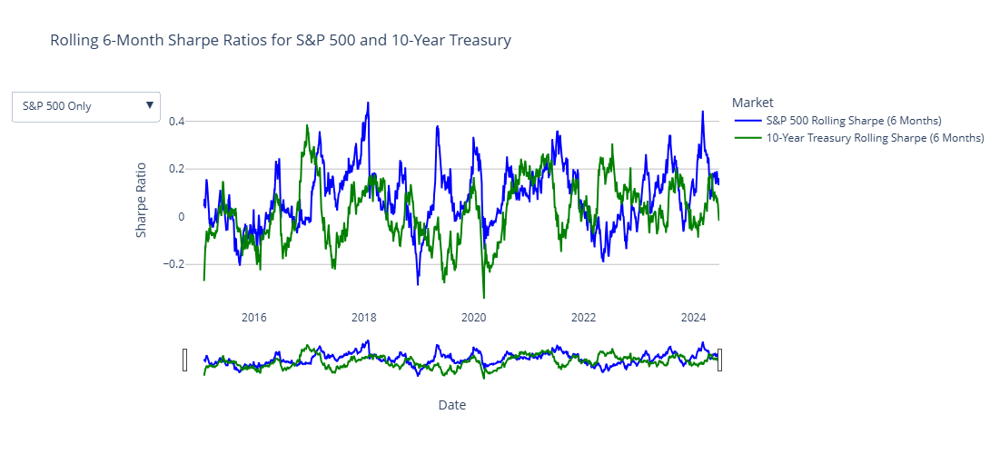

In [39]:
import plotly.express as px
import plotly.graph_objects as go

# Calculate 6-month rolling Sharpe Ratio for stock and bond returns
window = 126  # Approx. 6 months assuming 21 trading days per month
risk_free_rate = 0  # Assuming risk-free rate is 0 for simplicity

merged_data['Stock_Rolling_Sharpe'] = (
    (merged_data['Stock_Returns'].rolling(window).mean() - risk_free_rate) / 
    merged_data['Stock_Returns'].rolling(window).std()
)
merged_data['Bond_Rolling_Sharpe'] = (
    (merged_data['Bond_Returns'].rolling(window).mean() - risk_free_rate) / 
    merged_data['Bond_Returns'].rolling(window).std()
)

# Create Plotly figure for Rolling Sharpe Ratios
fig_sharpe = go.Figure()

# Add stock rolling Sharpe trace with customized hover
fig_sharpe.add_trace(go.Scatter(
    x=merged_data['Date'], 
    y=merged_data['Stock_Rolling_Sharpe'], 
    mode='lines', 
    name='S&P 500 Rolling Sharpe (6 Months)',
    line=dict(color='blue'),
    hovertemplate='%{x}<br>S&P 500 Sharpe Ratio: %{y:.2f}',
))

# Add bond rolling Sharpe trace with customized hover
fig_sharpe.add_trace(go.Scatter(
    x=merged_data['Date'], 
    y=merged_data['Bond_Rolling_Sharpe'], 
    mode='lines', 
    name='10-Year Treasury Rolling Sharpe (6 Months)',
    line=dict(color='green'),
    hovertemplate='%{x}<br>10-Year Treasury Sharpe Ratio: %{y:.2f}',
))

# Customize layout with additional interactivity
fig_sharpe.update_layout(
    title='Rolling 6-Month Sharpe Ratios for S&P 500 and 10-Year Treasury',
    xaxis_title='Date',
    yaxis_title='Sharpe Ratio',
    hovermode='closest',  # Interactive hovermode to see the closest point
    legend_title_text='Market',
    plot_bgcolor='white',
    width=1000,
    height=500,
    updatemenus=[  # Add interactive dropdown to toggle traces
        {
            "buttons": [
                {
                    "args": ["visible", [True, False]],  # Show only S&P 500
                    "label": "S&P 500 Only",
                    "method": "restyle"
                },
                {
                    "args": ["visible", [False, True]],  # Show only 10-Year Treasury
                    "label": "10-Year Treasury Only",
                    "method": "restyle"
                },
                {
                    "args": ["visible", [True, True]],  # Show both
                    "label": "Show Both",
                    "method": "restyle"
                }
            ],
            "direction": "down",
            "showactive": True,
        }
    ]
)

# Add zooming, panning, and range slider for more interaction
fig_sharpe.update_xaxes(rangeslider_visible=True, title_font=dict(size=14))
fig_sharpe.update_yaxes(showgrid=True, gridwidth=0.5, gridcolor='gray')

# Show the plot
fig_sharpe.show()


### Conclusion from 6-Month Rolling Sharpe Ratios for S&P 500 and 10-Year Treasury

1. **Stocks Are More Volatile**: The S&P 500 (blue line) has larger swings in its Sharpe Ratio, showing that stocks experience more variability in risk-adjusted returns compared to the 10-Year Treasury (green line).

2. **Crisis Impact**: During economic crises (e.g., 2020 COVID-19), the Sharpe Ratio for stocks drops sharply, while bonds remain relatively stable. This highlights bonds' role as a safe asset during market turmoil.

3. **Diverging Performance**: At various points, stocks and bonds show opposite trends in Sharpe Ratios, suggesting that bonds can provide stability when stock risk-adjusted performance declines.

4. **Overall Trend**: Stocks offer higher potential returns but with more risk, whereas bonds deliver steadier, lower risk-adjusted returns, making them a valuable component for risk management in a portfolio.


## Sortino Ratio

**Definition**: The Sortino Ratio is a variation of the Sharpe Ratio that only considers downside volatility (the standard deviation of negative returns). It provides a more focused measure of risk by penalizing only negative returns, making it especially useful for assets with high upside potential and limited downside.

**Formula**:
$$
\text{Sortino Ratio} = \frac{E[R] - R_f}{\sigma_{\text{downside}}}
$$
where:
- $ E[R] $: Expected return of the asset
- $ R_f $: Risk-free rate (typically assumed to be 0 if not specified)
- $ \sigma_{\text{downside}} $: Standard deviation of negative (downside) returns only

**Purpose**: By focusing only on downside risk, the Sortino Ratio provides a more nuanced view of risk-adjusted returns, particularly for assets that may experience high positive returns but limited downside. In our analysis, the 6-month rolling Sortino Ratio will help show the periods where downside risk heavily impacted returns.

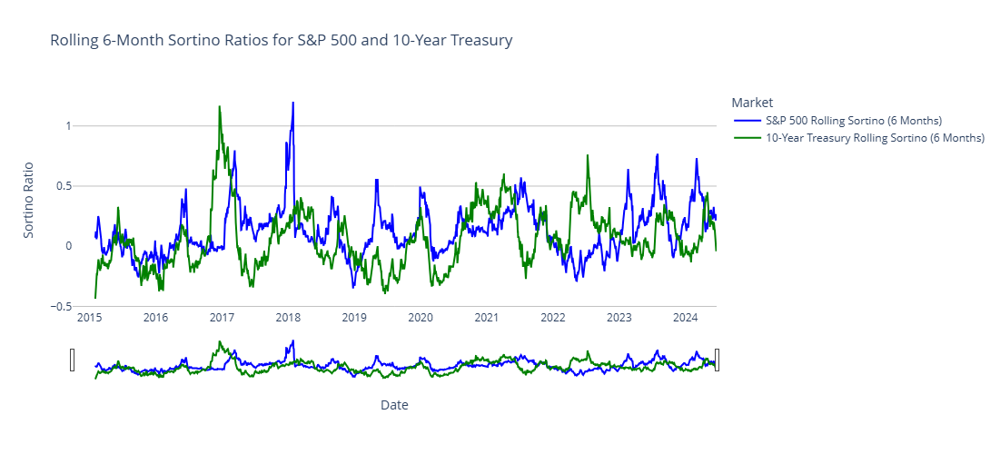

In [40]:
# Function to calculate downside standard deviation
def downside_std(returns):
    return returns[returns < 0].std()

# Calculate 6-month rolling Sortino Ratio for stock and bond returns
merged_data['Stock_Rolling_Sortino'] = (
    (merged_data['Stock_Returns'].rolling(window).mean() - risk_free_rate) / 
    merged_data['Stock_Returns'].rolling(window).apply(downside_std)
)
merged_data['Bond_Rolling_Sortino'] = (
    (merged_data['Bond_Returns'].rolling(window).mean() - risk_free_rate) / 
    merged_data['Bond_Returns'].rolling(window).apply(downside_std)
)

# Create Plotly figure for Rolling Sortino Ratios
fig_sortino = go.Figure()

# Add stock rolling Sortino trace
fig_sortino.add_trace(go.Scatter(
    x=merged_data['Date'], 
    y=merged_data['Stock_Rolling_Sortino'], 
    mode='lines', 
    name='S&P 500 Rolling Sortino (6 Months)',
    line=dict(color='blue'),
    hoverinfo='x+y'
))

# Add bond rolling Sortino trace
fig_sortino.add_trace(go.Scatter(
    x=merged_data['Date'], 
    y=merged_data['Bond_Rolling_Sortino'], 
    mode='lines', 
    name='10-Year Treasury Rolling Sortino (6 Months)',
    line=dict(color='green'),
    hoverinfo='x+y'
))

# Customize layout
fig_sortino.update_layout(
    title='Rolling 6-Month Sortino Ratios for S&P 500 and 10-Year Treasury',
    xaxis_title='Date',
    yaxis_title='Sortino Ratio',
    hovermode='x unified',
    legend_title_text='Market',
    plot_bgcolor='white',
    width=1000,
    height=500
)

# Add zooming and range slider for interaction
fig_sortino.update_xaxes(rangeslider_visible=True)
fig_sortino.update_yaxes(showgrid=True, gridwidth=0.5, gridcolor='gray')

# Show the plot
fig_sortino.show()

### Conclusion from 6-Month Rolling Sortino Ratios for S&P 500 and 10-Year Treasury

1. **Stocks Have Higher Upside Potential but More Downside Risk**: The Sortino Ratio for the S&P 500 (blue line) shows larger peaks and valleys, indicating greater swings in risk-adjusted returns, particularly during positive market conditions.

2. **Bonds Remain Steadier**: The 10-Year Treasury (green line) has a more stable Sortino Ratio, suggesting bonds experience fewer extreme changes in risk-adjusted returns, providing a smoother performance.

3. **Divergence During Crises**: During periods of market stress, the Sortino Ratio for stocks often drops, while bonds remain relatively stable. This highlights bonds' role as a safer asset when markets are volatile.

4. **Comparative Stability**: Although both assets experience changes in Sortino Ratios over time, stocks are more volatile with both higher potential returns and higher downside risks, while bonds offer steadier returns with lower risk.

In summary, stocks offer higher potential risk-adjusted returns but come with increased downside risk, while bonds serve as a stable, lower-risk option.


## Point 5: Diversification Potential
A diversified portfolio of stocks and bonds can provide more stable returns, especially during times of high stock market volatility.

Visual: A dynamic portfolio allocation tool that allows the user to adjust the ratio between stocks and bonds and visualize the resulting risk/return profile.
Interaction: Slider for adjusting stock-bond allocation, real-time updates to the risk/return plot.  
Visual Tools: Plotly

#### Our Unique Dynamic Portfolio Allocation:

The slider allows users to adjust the allocation between stocks and bonds (0% to 100% in steps).  
The plot updates in real-time to show the resulting risk (volatility) and return for each allocation.  
1. Risk/Return Profile:  
  
The x-axis represents risk (volatility), while the y-axis represents the return.  
As the user increases the allocation to bonds, the risk typically decreases, showcasing the benefits of diversification.  

2. Hover Tool:  
  
Hovering over any point on the line will show the exact risk and return values for the chosen allocation.  
Slider Interaction:  
  
The slider allows the user to dynamically explore different allocations, from 100% bonds (minimal risk, low return) to 100% stocks (high risk, high return), and observe how the risk/return profile changes.  

3. Real-World Application:  
This tool helps demonstrate how diversifying between stocks and bonds can reduce portfolio volatility, especially during periods of stock market turbulence. It’s an essential tool for portfolio optimization, providing investors with a visual understanding of the risk-return tradeoff.  

### About the Portfolio Risk and Return
- **Portfolio Return**: 
  The total portfolio return$( R_p$) is calculated as the weighted average of the stock returns$( R_s$) and bond returns$( R_b$), where the allocation to stocks is$( w_s$) and the allocation to bonds is$( w_b = 1 - w_s$).

  $$
  R_p = w_s \cdot R_s + (1 - w_s) \cdot R_b
  $$

- **Portfolio Volatility (Risk)**:
  The volatility of the portfolio$( \sigma_p$) is derived from the volatilities of stocks$( \sigma_s$) and bonds$( \sigma_b$). Assuming no correlation between stock and bond returns (for simplicity), the formula for portfolio volatility is:

  $$
  \sigma_p = \sqrt{w_s^2 \cdot \sigma_s^2 + (1 - w_s)^2 \cdot \sigma_b^2}
  $$

  Where:
  - $ w_s $: Stock allocation
  - $ R_s $: Stock returns
  - $ R_b $: Bond returns
  - $ \sigma_s $: Stock volatility (standard deviation of stock returns)
  - $ \sigma_b $: Bond volatility (standard deviation of bond returns).


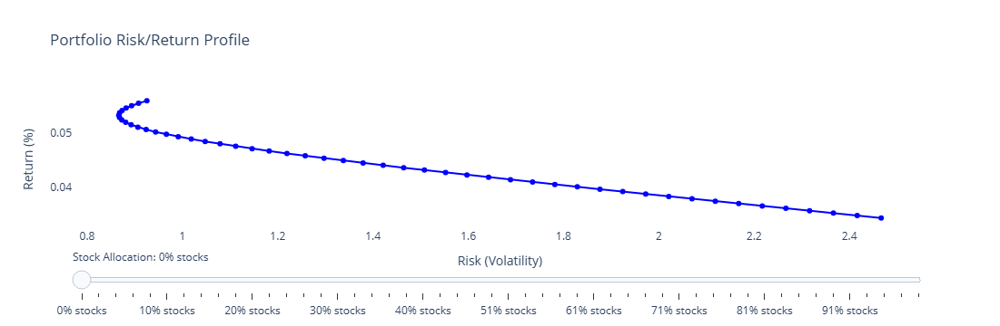

In [41]:
# Calculate average returns and volatility for S&P 500 and 10-Year Treasury
stock_returns = merged_data['Stock_Returns']
bond_returns = merged_data['Bond_Returns']
stock_volatility = merged_data['Stock_Rolling_Volatility']
bond_volatility = merged_data['Bond_Rolling_Volatility']

# Create a function to calculate portfolio risk and return based on allocation
def calculate_portfolio(allocation):
    # Portfolio return: weighted average of stock and bond returns
    portfolio_return = allocation * stock_returns.mean() + (1 - allocation) * bond_returns.mean()
    
    # Portfolio volatility (risk): based on the standard deviation of returns
    # Assuming no correlation between stocks and bonds for simplicity
    portfolio_risk = np.sqrt((allocation**2 * stock_volatility.mean()**2) + 
                             ((1 - allocation)**2 * bond_volatility.mean()**2))
    return portfolio_return, portfolio_risk

# Define slider steps for stock-bond allocation
allocation_steps = np.linspace(0, 1, 50)  # Range from 0% stocks (100% bonds) to 100% stocks (0% bonds)

# Create lists to hold portfolio return and risk values
portfolio_returns = []
portfolio_risks = []

# Calculate return and risk for each allocation
for allocation in allocation_steps:
    ret, risk = calculate_portfolio(allocation)
    portfolio_returns.append(ret)
    portfolio_risks.append(risk)

# Create the figure
fig = go.Figure()

# Add scatter plot for risk/return profile
fig.add_trace(go.Scatter(
    x=portfolio_risks, 
    y=portfolio_returns, 
    mode='lines+markers', 
    name='Risk/Return Profile',
    hoverinfo='x+y',
    line=dict(color='blue')
))

# Customize layout with titles and labels
fig.update_layout(
    title='Portfolio Risk/Return Profile',
    xaxis_title='Risk (Volatility)',
    yaxis_title='Return (%)',
    hovermode='x unified',
    legend_title_text='Allocation',
    plot_bgcolor='white'
)

# Add slider for adjusting stock-bond allocation
fig.update_layout(
    sliders=[{
        'active': 0,
        'currentvalue': {"prefix": "Stock Allocation: "},
        'steps': [{
            'label': f'{int(allocation * 100)}% stocks',
            'method': 'restyle',
            'args': [{'x': [portfolio_risks[:i+1]], 'y': [portfolio_returns[:i+1]]}]
        } for i, allocation in enumerate(allocation_steps)]
    }]
)

# Show the interactive plot
fig.show()

### Visual Layout for Portfolio Risk/Return Profile

- **Visuals**:
  - **Blue line with markers**: Represents the risk/return profile of the portfolio as the allocation between **stocks** and **bonds** changes. The line shows how the risk (volatility) and return vary based on different stock-bond allocations.

- **Interactivity**:
  - **Hover Tool**: Displays the exact risk and return values at each point on the risk/return profile.
  - **Slider**: Allows users to dynamically adjust the allocation between **stocks and bonds** (from 0% stocks to 100% stocks) and see how the portfolio's risk and return change in real time.

- **Colors and Layout**:
  - **Colors**: Blue is used for the risk/return profile line.
  - **Axes**:
    - **X-axis**: Represents the **Risk (Volatility)** of the portfolio.
    - **Y-axis**: Represents the **Return (%)** of the portfolio.
  
- **Annotations**:
  - The slider dynamically updates the chart, allowing users to see how the portfolio risk/return profile evolves as they increase or decrease the stock allocation.
  - **Legend**: Clearly shows that the plot represents the risk/return profile based on varying stock-bond allocations.


## Point6: ARIMA prediction

In [42]:
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

In [43]:
# Function to find the best ARIMA parameters based on AIC
def find_best_arima(data, max_p=3, max_d=2, max_q=3):
    best_aic = np.inf
    best_order = None
    for p in range(max_p + 1):
        for d in range(max_d + 1):
            for q in range(max_q + 1):
                try:
                    model = ARIMA(data, order=(p, d, q))
                    results = model.fit()
                    if results.aic < best_aic:
                        best_aic = results.aic
                        best_order = (p, d, q)
                except:
                    continue
    return best_order

# Find best ARIMA order for stock and bond returns
best_order_stock = find_best_arima(stock_returns)
best_order_bond = find_best_arima(bond_returns)

print(f"Best ARIMA order for Stock Returns: {best_order_stock}")
print(f"Best ARIMA order for Bond Returns: {best_order_bond}")

Best ARIMA order for Stock Returns: (3, 0, 2)
Best ARIMA order for Bond Returns: (2, 0, 3)


In [44]:
# Fit ARIMA models for stock and bond returns
stock_model = ARIMA(stock_returns, order=best_order_stock)
stock_model_fit = stock_model.fit()

bond_model = ARIMA(bond_returns, order=best_order_bond)
bond_model_fit = bond_model.fit()

# Print summaries
print("Stock Model Summary:")
print(stock_model_fit.summary())
print("\nBond Model Summary:")
print(bond_model_fit.summary())


Stock Model Summary:
                               SARIMAX Results                                
Dep. Variable:          Stock_Returns   No. Observations:                 3553
Model:                 ARIMA(3, 0, 2)   Log Likelihood               -5309.630
Date:                Thu, 07 Nov 2024   AIC                          10633.261
Time:                        20:01:21   BIC                          10676.490
Sample:                             0   HQIC                         10648.677
                               - 3553                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0560      0.026      2.166      0.030       0.005       0.107
ar.L1         -1.4961      0.015    -99.455      0.000      -1.526      -1.467
ar.L2         -0.3024      0.01

In [45]:
forecast_days = 30

# Stock forecast
stock_forecast = stock_model_fit.get_forecast(steps=forecast_days)
stock_forecast_mean = stock_forecast.predicted_mean
stock_conf_int = stock_forecast.conf_int()

# Bond forecast
bond_forecast = bond_model_fit.get_forecast(steps=forecast_days)
bond_forecast_mean = bond_forecast.predicted_mean
bond_conf_int = bond_forecast.conf_int()


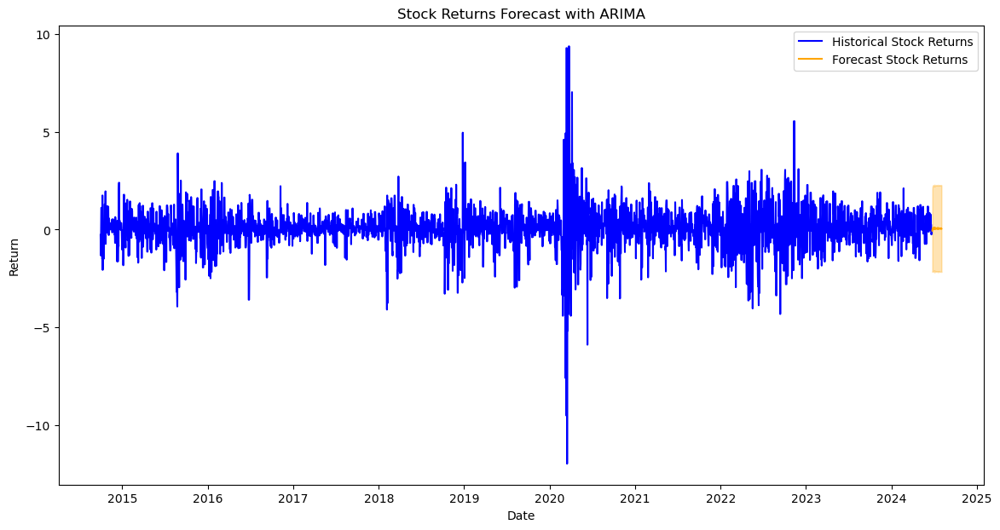

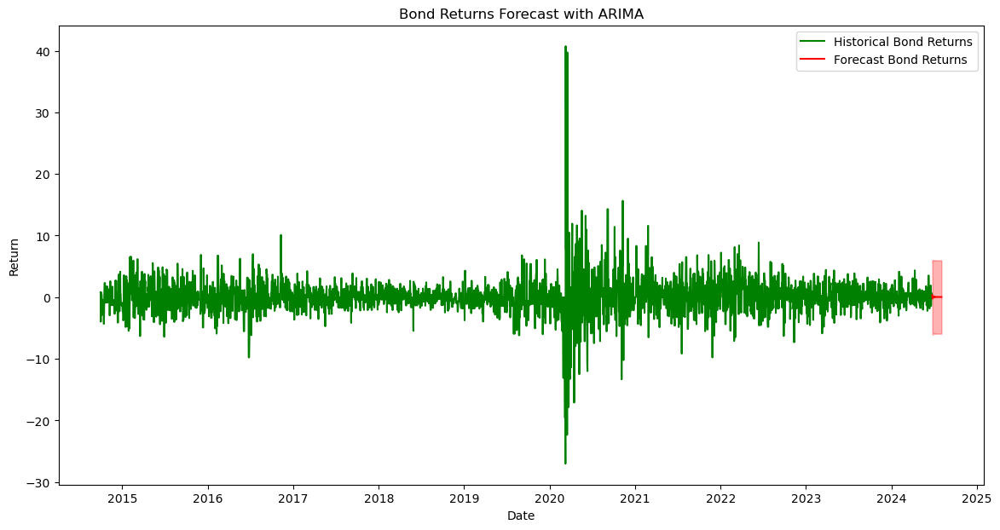

In [46]:
# Ensure the index of merged_data is in datetime format
merged_data.index = pd.to_datetime(merged_data['Date'])

# Extract stock and bond returns from merged_data
stock_returns = merged_data['Stock_Returns']
bond_returns = merged_data['Bond_Returns']

# Define the number of forecast days
forecast_days = 30  # Adjust as needed

# Generate forecast dates based on the last date in merged_data
forecast_dates = pd.date_range(start=merged_data.index[-1] + pd.Timedelta(days=1), periods=forecast_days, freq='B')

# Plot the stock forecast
plt.figure(figsize=(14, 7))
plt.plot(stock_returns, label='Historical Stock Returns', color='blue')
plt.plot(forecast_dates, stock_forecast_mean, label='Forecast Stock Returns', color='orange')
plt.fill_between(forecast_dates, stock_conf_int.iloc[:, 0], stock_conf_int.iloc[:, 1], color='orange', alpha=0.3)
plt.title('Stock Returns Forecast with ARIMA')
plt.xlabel('Date')
plt.ylabel('Return')
plt.legend()
plt.show()

# Plot the bond forecast
plt.figure(figsize=(14, 7))
plt.plot(bond_returns, label='Historical Bond Returns', color='green')
plt.plot(forecast_dates, bond_forecast_mean, label='Forecast Bond Returns', color='red')
plt.fill_between(forecast_dates, bond_conf_int.iloc[:, 0], bond_conf_int.iloc[:, 1], color='red', alpha=0.3)
plt.title('Bond Returns Forecast with ARIMA')
plt.xlabel('Date')
plt.ylabel('Return')
plt.legend()
plt.show()



In [47]:
# Example of calculating MAPE for model evaluation
def mean_absolute_percentage_error(y_true, y_pred): 
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Example: Calculate MAPE on a validation set (split the data into training/validation sets first)


In [48]:
# Ensure 'Date' is in datetime format
merged_data['Date'] = pd.to_datetime(merged_data['Date'])

# Set 'Date' as the index of the DataFrame
merged_data.set_index('Date', inplace=True)

# Check the data to ensure the index is now properly set
print(merged_data.head())

            Close/Last     Open     High      Low  US1M  US3M  US6M  US1Y  \
Date                                                                        
2014-09-30     1972.29  1978.21  1985.17  1968.96  0.02  0.02  0.03  0.13   
2014-10-01     1946.16  1971.44  1971.44  1941.72  0.01  0.02  0.04  0.10   
2014-10-02     1946.17  1945.83  1952.32  1926.03  0.01  0.01  0.03  0.10   
2014-10-03     1967.90  1948.12  1971.19  1948.12  0.01  0.01  0.03  0.11   
2014-10-04         NaN      NaN      NaN      NaN   NaN   NaN   NaN   NaN   

            US2Y  US3Y  ...  Cumulative_Stock_Returns  \
Date                    ...                             
2014-09-30  0.58  1.07  ...                 -0.002786   
2014-10-01  0.53  1.00  ...                 -0.015998   
2014-10-02  0.53  1.01  ...                 -0.015993   
2014-10-03  0.57  1.05  ...                 -0.005006   
2014-10-04   NaN   NaN  ...                  0.006104   

            Cumulative_Bond_Returns  Rolling_Correlation  \


In [54]:
# Convert Stock_Returns from percentage to decimal form
merged_data['Stock_Returns'] = merged_data['Stock_Returns'] / 100

# Similarly, if Bond_Returns is also in percentage form, do the same
merged_data['Bond_Returns'] = merged_data['Bond_Returns'] / 100


                           Strategy
-------------------------  ----------
Start Period               2014-09-30
End Period                 2024-06-21
Risk-Free Rate             0.0%
Time in Market             100.0%

Cumulative Return          482.76%
CAGR﹪                     13.32%

Sharpe                     0.79
Prob. Sharpe Ratio         99.83%
Smart Sharpe               0.63
Sortino                    1.12
Smart Sortino              0.9
Sortino/√2                 0.79
Smart Sortino/√2           0.64
Omega                      1.16

Max Drawdown               -45.98%
Longest DD Days            808
Volatility (ann.)          17.94%
Calmar                     0.29
Skew                       -0.11
Kurtosis                   13.11

Expected Daily %           0.05%
Expected Monthly %         1.5%
Expected Yearly %          17.38%
Kelly Criterion            7.63%
Risk of Ruin               0.0%
Daily Value-at-Risk        -1.8%
Expected Shortfall (cVaR)  -1.8%

Max Consecutive Wins      

None

,Start,Valley,End,Days,Max Drawdown,99% Max Drawdown
1,2021-11-19,2022-10-16,2023-06-01,560,-45.981743,-43.427145
2,2018-09-21,2018-12-25,2019-07-02,285,-37.043016,-33.920739
3,2020-01-21,2020-03-23,2020-06-07,139,-35.588480,-34.664655
4,2015-05-22,2016-01-20,2017-08-06,808,-35.122594,-31.937048
5,2018-01-29,2018-02-08,2018-03-09,40,-13.929882,-12.644333


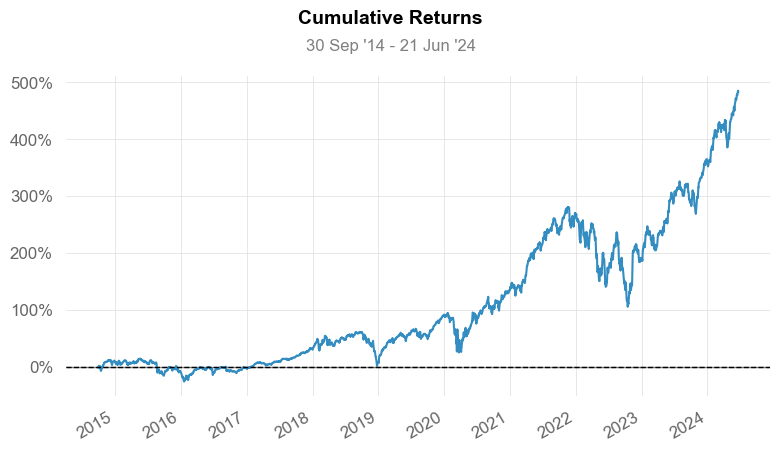

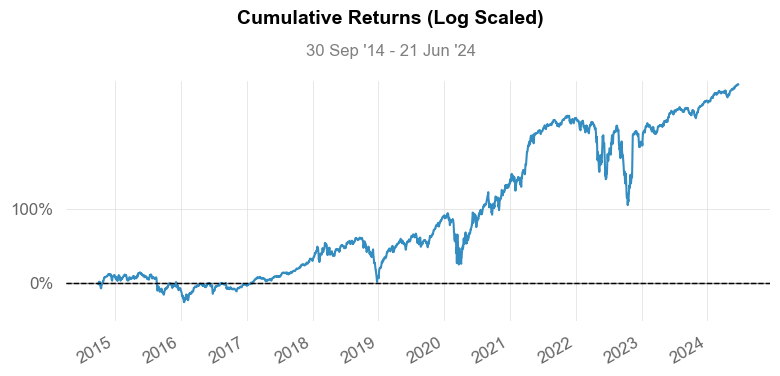

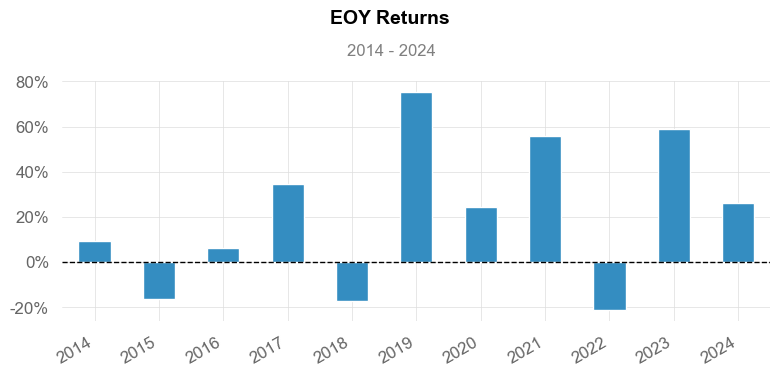

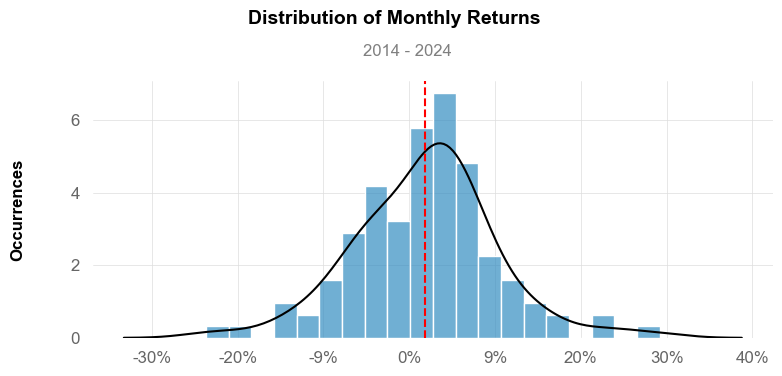

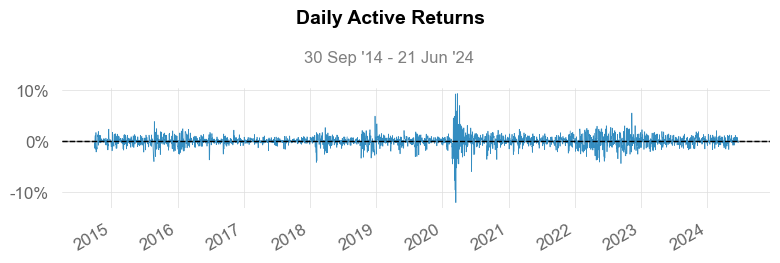

...

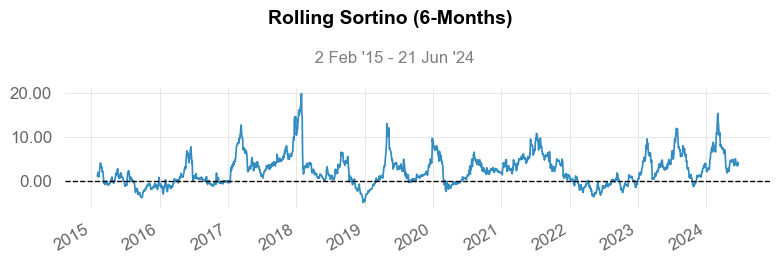

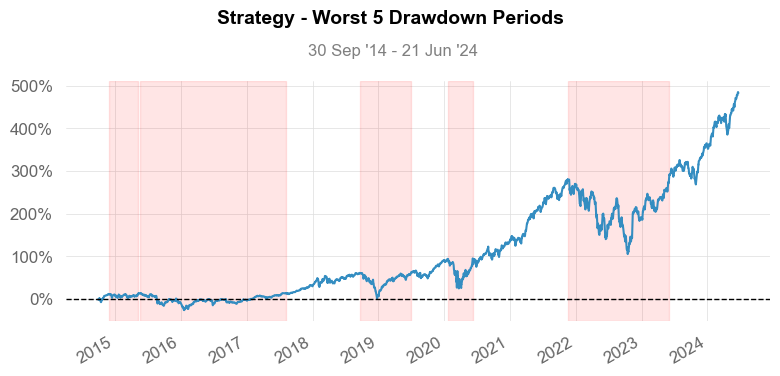

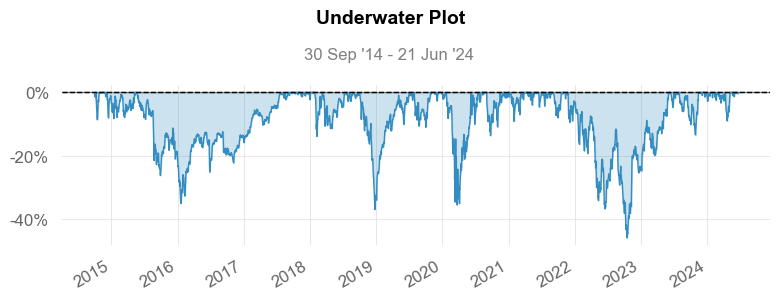

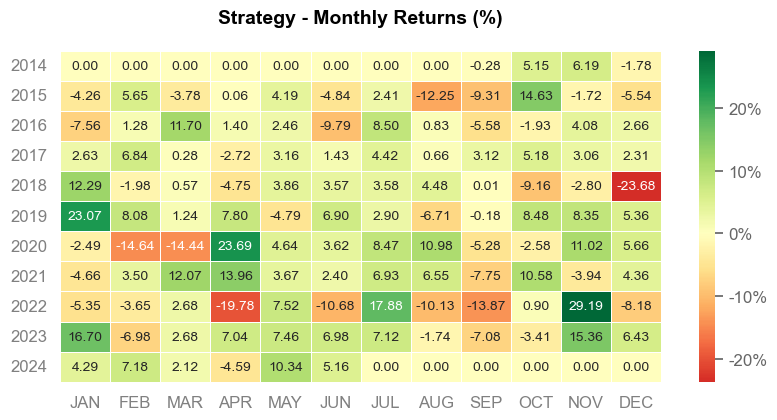

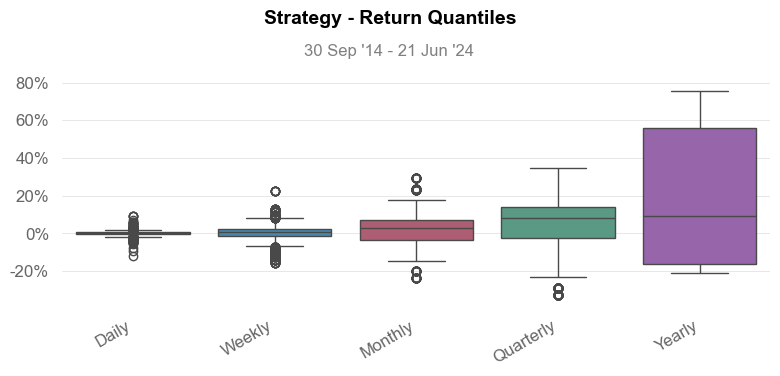

In [51]:
import quantstats as qs
qs.reports.full(merged_data['Stock_Returns'])

                           Strategy
-------------------------  ----------
Start Period               2014-09-30
End Period                 2024-06-21
Risk-Free Rate             0.0%
Time in Market             91.0%

Cumulative Return          -34.66%
CAGR﹪                     -2.97%

Sharpe                     0.18
Prob. Sharpe Ratio         74.94%
Smart Sharpe               0.13
Sortino                    0.26
Smart Sortino              0.19
Sortino/√2                 0.18
Smart Sortino/√2           0.13
Omega                      1.03

Max Drawdown               -98.02%
Longest DD Days            3552
Volatility (ann.)          48.35%
Calmar                     -0.03
Skew                       0.67
Kurtosis                   24.12

Expected Daily %           -0.01%
Expected Monthly %         -0.36%
Expected Yearly %          -3.79%
Kelly Criterion            1.65%
Risk of Ruin               0.0%
Daily Value-at-Risk        -4.98%
Expected Shortfall (cVaR)  -4.98%

Max Consecutive Wins

None

,Start,Valley,End,Days,Max Drawdown,99% Max Drawdown
1,2014-10-01,2020-04-16,2024-06-21,3552,-98.024897,-97.506837


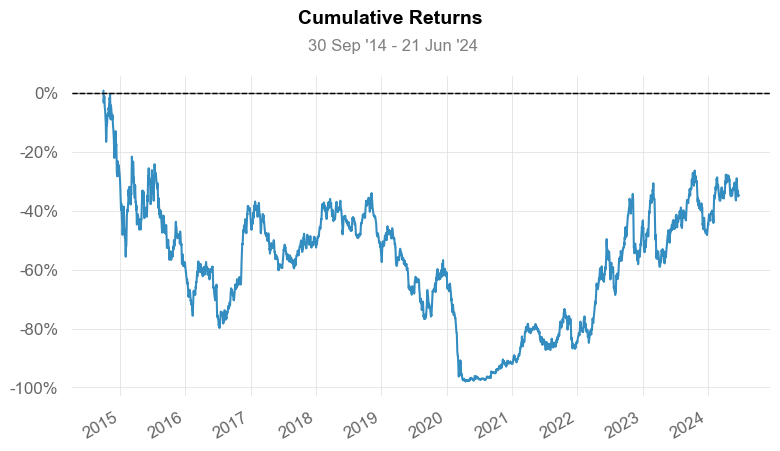

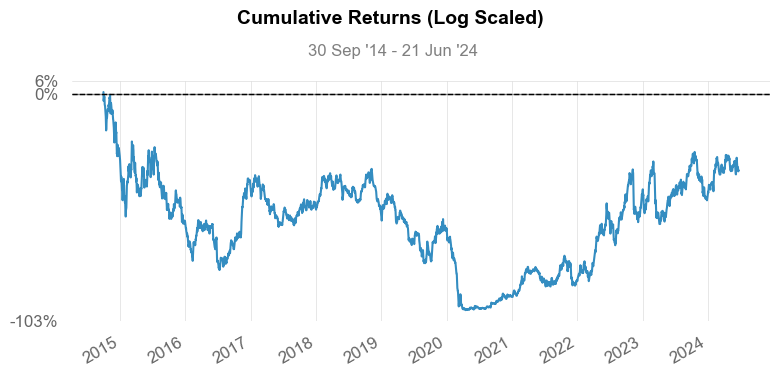

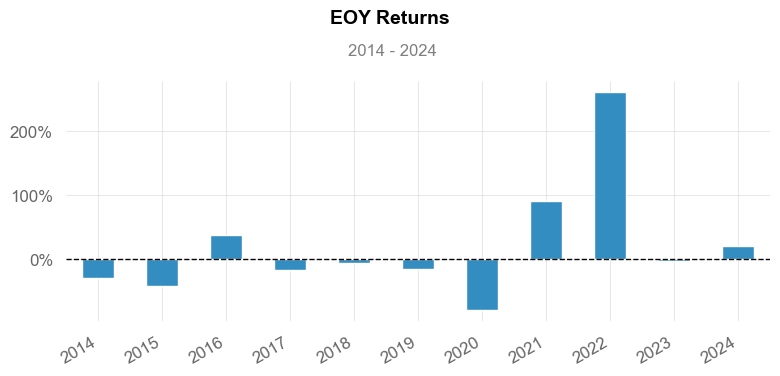

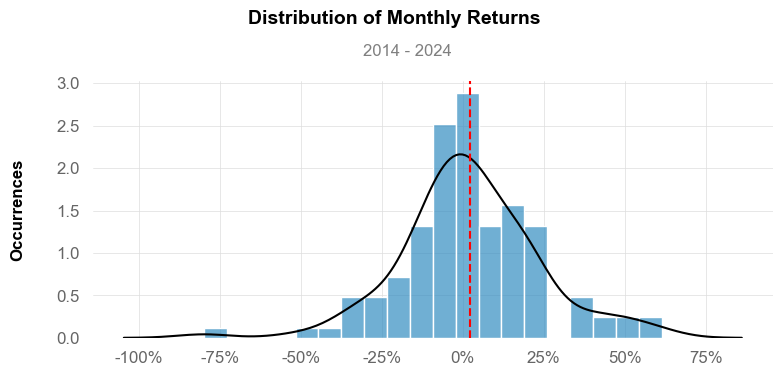

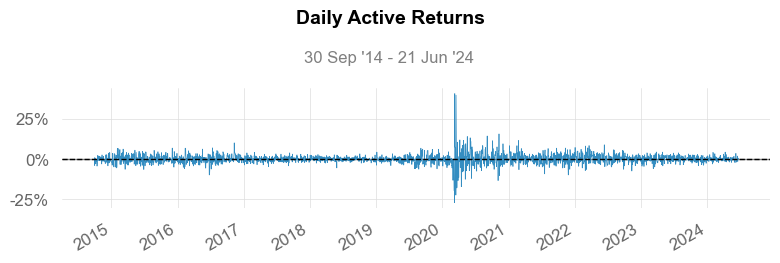

...

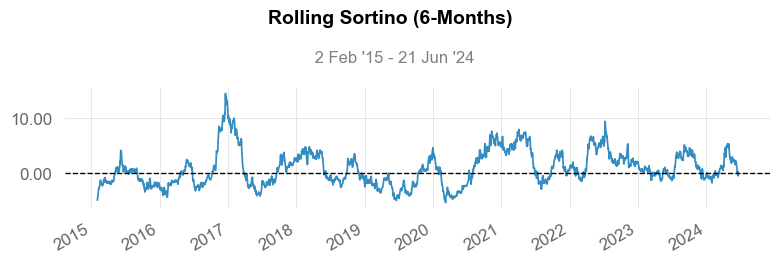

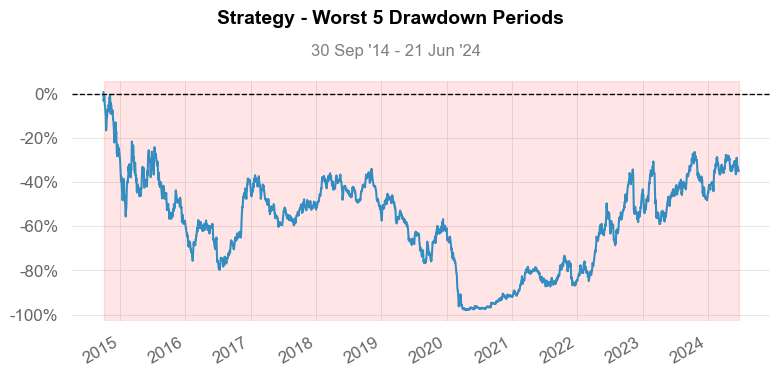

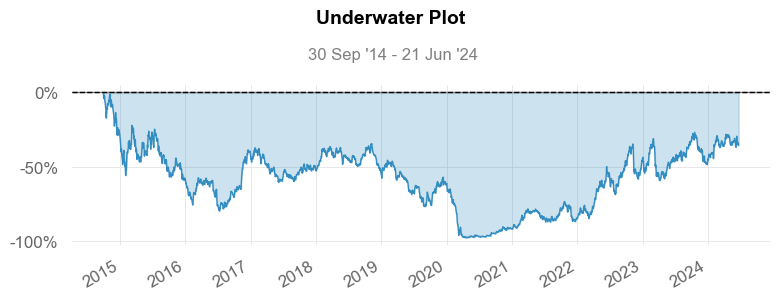

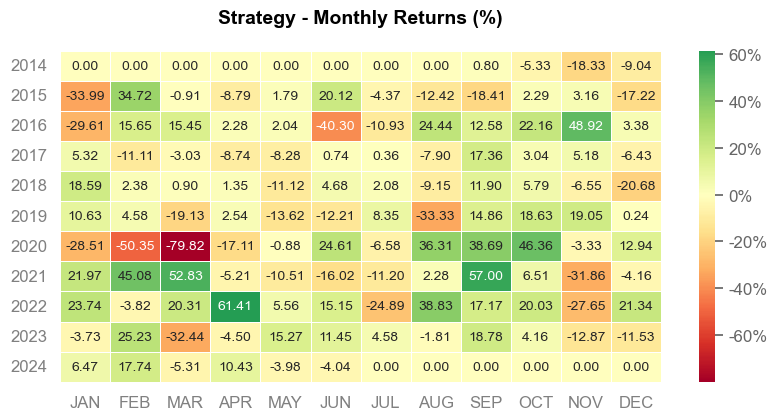

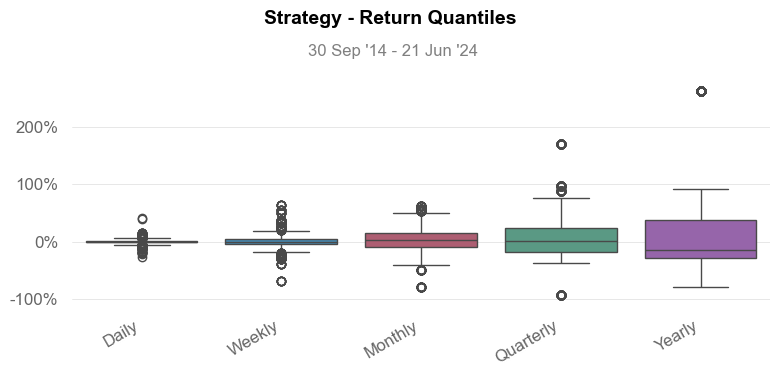

In [52]:
qs.reports.full(merged_data['Bond_Returns'])

In [53]:
# Cumulative returns for stocks (S&P 500)
merged_data['Cumulative_Stock_Returns'] = (1 + merged_data['Stock_Returns'] / 100).cumprod() - 1

# Cumulative returns for bonds (10-Year Treasury Yield)
merged_data['Cumulative_Bond_Returns'] = (1 + merged_data['Bond_Returns'] / 100).cumprod() - 1

### Project Conclusion

This project analyzed the relationship between stocks (S&P 500) and bonds (10-Year U.S. Treasury), providing insights into portfolio diversification, risk management, and asset allocation. Here’s a summary of our findings:

1. **Stock vs. Bond Returns**:
   - Stocks show higher volatility and respond sharply to economic events, whereas bonds tend to be more stable, highlighting their role as a "safe haven" in times of market stress.

2. **Correlation Analysis**:
   - Stocks and bonds generally have low or weak correlation. During crises (e.g., COVID-19), the correlation becomes negative, underscoring bonds' value in hedging stock risk.

3. **Volatility Comparison**:
   - Stocks exhibit consistently higher volatility than bonds, with sharp increases during crises. Bonds provide a stabilizing effect, balancing portfolio risk.

4. **Risk-Adjusted Performance (Sharpe and Sortino Ratios)**:
   - Stocks outperform on a risk-adjusted basis during bullish periods, while bonds maintain stable returns. This highlights the benefit of a mixed portfolio to adapt to varying conditions.

5. **Portfolio Diversification**:
   - A balanced stock-bond allocation optimizes risk and return, supporting steady growth while reducing exposure to market swings.

6. **ARIMA Forecasting**:
   - Forecasts using ARIMA models provide insights into potential future returns for stocks and bonds, assisting in proactive portfolio adjustments.

### Conclusion
This analysis underscores the importance of a diversified portfolio. Bonds act as a buffer during downturns, and a balanced stock-bond mix offers stability and growth. These insights can guide investors in making informed, adaptable investment decisions across different market conditions.
